In [1]:
import os
from pathlib import Path

import dotenv
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import RichProgressBar
from pytorch_lightning.loggers import WandbLogger

import wandb
from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3
from inz.models.bdanet_simplified import BDANetSimplified
from inz.util import get_loc_cls_weights, show_masks_comparison

from inz.data.transform import ResizeCrop

In [2]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [3]:
# seriously?
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

### Tensor sizes sanity check

In [4]:
model = BDANetSimplified(n_classes=6, loss=nn.CrossEntropyLoss()).to(device)

x_pre = torch.rand([16, 3, 256, 256]).to(device)
x_post = torch.rand([16, 3, 256, 256]).to(device)

with torch.no_grad():
    out = model(x_pre, x_post)
    assert out.shape == (16, 6, 256, 256), f"Shape is {out.size}"

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


In [5]:
dm = XBDDataModule(
    path=Path("data/xBD_processed"),
    events={
        # Tier1: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        Tier3: [
            Event.joplin_tornado,
            #     # Event.moore_tornado,
            #     # Event.tuscaloosa_tornado
        ],
        # Hold: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        # Test: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
    },
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=24,
    val_batch_size=24,
    test_batch_size=24,
    # split_events={
    #     "train": {
    #         Tier1: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             # Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Tier3: [
    #             Event.joplin_tornado,
    #             Event.moore_tornado,
    #             Event.tuscaloosa_tornado
    #         ],
    #     },
    #     "val": {
    #         Hold: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Test: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #     },
    # },
    transform=T.Compose(
        transforms=[
            # T.RandomVerticalFlip(p=0.5),
            # T.RandomApply(p=0.6, transforms=[
            #     T.RandomAffine(degrees=[-10, 10], scale=[0.9, 1.1], translate=[0.1, 0.1]),
            # ]),
            # # T.RandomResizedCrop(size=256, scale=[0.85, 1.15], interpolation=T.InterpolationMode.NEAREST)
            ResizeCrop(p=0.2, crop_size=128, resize_size=256),
            T.Resize(256)
        ]
    ),
    drop_unclassified_channel=True
)
dm.prepare_data()
dm.setup("fit")

print(f"{len(dm.train_dataloader())} train batches, {len(dm.val_dataloader())} val batches")

85 train batches, 15 val batches


In [6]:
it = iter(dm.train_dataloader())

In [ ]:
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.figsize"] = [20, 120]


hithit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hithit

hithit

hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hithit

hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hithit

hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hithit

hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hit
hithit

hit


In [ ]:
batch = next(it)


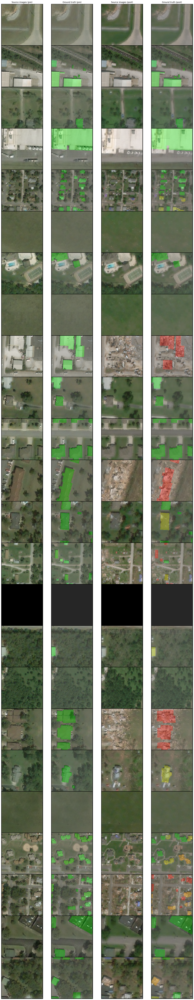

In [ ]:
show_masks_comparison(batch[0], batch[2], batch[1], batch[3])

In [ ]:
loc_weights, cls_weights = get_loc_cls_weights(dataloader=dm.train_dataloader(), device=device)

print(f"Localization weights: {loc_weights}\nClassification weights: {cls_weights}")

Computing class weights: 100%|██████████| 85/85 [00:20<00:00,  4.05it/s]

Localization weights: tensor([0.1849, 0.8151], device='cuda:0')
Classification weights: tensor([0., 0., 0., 0., 0., nan], device='cuda:0')


In [ ]:
# assert (WANDB_API_KEY := os.getenv("WANDB_API_KEY"))

# wandb.login(key=WANDB_API_KEY, verify=True)

# wandb_logger = WandbLogger(project="test")

In [ ]:
trainer = pl.Trainer(
    max_epochs=20,
    callbacks=[
        RichProgressBar(),
    ],
    precision="bf16",
    # logger=wandb_logger,
)
trainer.fit(model, datamodule=dm)

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/lightning_fabric/connector.py:563: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /home/tomek/inz/inz/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃    ┃ Name                ┃ Type                ┃ Params ┃
┡━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0  │ loss_fn             │ CrossEntropyLoss    │      0 │
│ 1  │ down_conv1          │ Sequential          │  9.5 K │
│ 2  │ down_conv2          │ Sequential          │  231 K │
│ 3  │ down_conv3          │ Sequential          │  1.3 M │
│ 4  │ down_conv4          │ Sequential          │  7.8 M │
│ 5  │ down_conv5          │ Sequential          │ 16.1 M │
│ 6  │ up_conv54           │ UpConv              │  7.7 M │
│ 7  │ up_conv43           │ UpConv              │  1.0 M │
│ 8  │ up_conv32           │ UpConv              │  258 K │
│ 9  │ up_conv21           │ UpConv              │ 76.1 K │
│ 10 │ up_conv1_nores      │ ConvReLU            │ 13.9 K │
│ 11 │ outconv             │ Conv2d              │    390 │
│ 12 │ accuracy_loc        │ BinaryAccuracy      │      0 │
│ 13 │ iou_loc             │ MeanIoU             │      0 │
│ 14 │ f1                  │ MulticlassF1Score   │      0 │
│ 15 │ precision           │ MulticlassPrecision │      0 │
│ 16 │ recall              │ MulticlassRecall    │      0 │
│ 17 │ iou                 │ MeanIoU             │      0 │
│ 18 │ f1_per_class        │ MulticlassF1Score   │      0 │
│ 19 │ precision_per_class │ MulticlassPrecision │      0 │
│ 20 │ recall_per_class    │ MulticlassRecall    │      0 │
│ 21 │ iou_per_class       │ MeanIoU             │      0 │
└────┴─────────────────────┴─────────────────────┴────────┘

Trainable params: 34.6 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 M                                                                                               
Total estimated model params size (MB): 138

Output()

RuntimeError: Predictions and targets are expected to have the same shape, but got torch.Size([24, 6, 256, 256]) and torch.Size([24, 5, 256, 256]).

In [ ]:
model.eval()

In [ ]:
it = iter(dm.val_dataloader())
batch = next(it)
images_pre, masks_pre, images_post, masks_post = batch
with torch.no_grad():
    preds = model(images_pre.to(device), images_post.to(device))

In [ ]:
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.figsize"] = [20, 120]

show_masks_comparison(
    images_pre=images_pre, images_post=images_post, masks_pre=masks_pre, masks_post=masks_post, preds=preds, opacity=0.3
)